# Image Classification Using CNN


In [151]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set(style="whitegrid")
import os
import glob as gb
import cv2
import tensorflow as tf
import keras

now to define the path ( to swtich it between jupyter notebook & kaggle kernel)

In [152]:
# ### for Kaggle
# trainpath = '../input/intel-image-classification/seg_train/'
# testpath = '../input/intel-image-classification/seg_test/'
# predpath = '../input/intel-image-classification/seg_pred/'

## for Jupyter
trainpath = r"C:/Users/pc 1/Downloads/archive/Covid-19/"
testpath = r"C:/Users/pc 1/Downloads/archive/Covid-19/"
predpath = r"C:/Users/pc 1/Downloads/archive/Covid-19/"

# Open Folders

now let's first check the Train folder to have a look to its content

In [153]:
import cv2

image_path = os.path.join('C:/Users/pc 1/Downloads/archive/Covid-19/train/Covid', 'bmj.m606.full-p4-22%0.png')  # استبدل 'some_image.jpg' باسم صورة من المجلد
image = cv2.imread(image_path)
if image is not None:
    print("Image loaded successfully")
else:
    print("Failed to load image")


Image loaded successfully


In [154]:
for folder in  os.listdir(trainpath + 'train') :
    files = gb.glob(str(trainpath + 'train//' + folder + '/*.*'))
    print(f'For training data , found {len(files)} in folder {folder}')

For training data , found 279 in folder Covid
For training data , found 317 in folder NonCovid


ok , how about the test folder

In [155]:
for folder in  os.listdir(testpath +'test') :
    files = gb.glob(str(trainpath + 'test//' + folder + '/*.*'))
    print(f'For testing data , found {len(files)} in folder {folder}')

For testing data , found 36 in folder Covid
For testing data , found 41 in folder NonCovid


_____
now for prediction folder

In [156]:
files = gb.glob(pathname= str(predpath +'val/*.*'))
print(f'For Prediction data , found {len(files)}')

For Prediction data , found 77


_____

# Checking Images

now we need to heck the images sizes , to know ow they looks like

since we have 6 categories , we first need to create a dictionary with their names & indices , also create a function to get the code back

In [157]:
code	=	{'Covid':0,'NonCovid':1}
def getcode(n) :
    for x , y in code.items() :
        if n == y :
            return x

now how about the images sizes in train folder

In [158]:
size = []
for folder in os.listdir(trainpath + 'train'):
    files = gb.glob(pathname=str(trainpath + 'train//' + folder + '/*.*'))
    for file in files:
        try:
            image = cv2.imread(file)
            if image is not None:
                size.append(image.shape)
            else:
                print(f"Failed to load {file}: Image is None")
        except Exception as e:
            print(f"Error reading {file}: {e}")
size_counts = pd.Series(size).value_counts()
print(size_counts)


(202, 287, 3)    11
(261, 392, 3)     5
(512, 512, 3)     5
(304, 472, 3)     4
(124, 172, 3)     4
                 ..
(316, 472, 3)     1
(346, 448, 3)     1
(344, 440, 3)     1
(346, 442, 3)     1
(321, 507, 3)     1
Name: count, Length: 515, dtype: int64


______

ok , almost all of them are 150,150,3 , how about test images ?

In [159]:
size = []
for folder in os.listdir(testpath + 'test'):
    files = gb.glob(pathname=str(testpath + 'test//' + folder + '/*.*'))
    for file in files:
        try:
            image = cv2.imread(file)
            if image is not None:
                size.append(image.shape)
            else:
                print(f"Failed to load {file}: Image is None")
        except Exception as e:
            print(f"Error reading {file}: {e}")

size_counts = pd.Series(size).value_counts()
print(size_counts)

(202, 287, 3)    4
(124, 172, 3)    2
(269, 346, 3)    2
(374, 512, 3)    1
(155, 230, 3)    1
                ..
(194, 261, 3)    1
(344, 512, 3)    1
(338, 512, 3)    1
(347, 512, 3)    1
(476, 511, 3)    1
Name: count, Length: 72, dtype: int64


almost same ratios , now to prediction images

In [160]:
size = []
files = gb.glob(pathname= str(predpath +'val/*.*'))
for file in files:
    try:
        image = cv2.imread(file)
        if image is not None:
            size.append(image.shape)
        else:
            print(f"Failed to load {file}: Image is None")
    except Exception as e:
        print(f"Error reading {file}: {e}")

size_counts = pd.Series(size).value_counts()
print(size_counts)

(304, 472, 3)    4
(362, 370, 3)    2
(385, 584, 3)    2
(338, 512, 3)    2
(237, 354, 3)    1
                ..
(398, 512, 3)    1
(210, 250, 3)    1
(211, 254, 3)    1
(211, 251, 3)    1
(410, 512, 3)    1
Name: count, Length: 71, dtype: int64


ok , since almost all of pictures are 150,150,3 , we can feel comfort in using all pictures in our model , after resizing it in a specific amount

# Reading Images

now it's time to read all images & convert it into arrays

first we'll create a variable s , which refer to size , so we can change it easily

let's use now size = 100 , so it will be suitable amount to contain accuracy without losing so much time in training

In [161]:
s = 100

now to read all pictues in six categories in training folder, ans use OpenCV to resize it , and not to forget to assign the y value , from the predefined function

In [162]:
X_train = []
y_train = []
for folder in  os.listdir(trainpath +'train') :
    files = gb.glob(pathname= str( trainpath +'train//' + folder + '/*.*'))
    for file in files:
        image = cv2.imread(file)
        image_array = cv2.resize(image , (s,s))
        X_train.append(list(image_array))
        y_train.append(code[folder])

great , now how many items in X_train

In [163]:
print(f'we have {len(X_train)} items in X_train')

we have 596 items in X_train


also we have have a look to random pictures in X_train , and to adjust their title using the y value

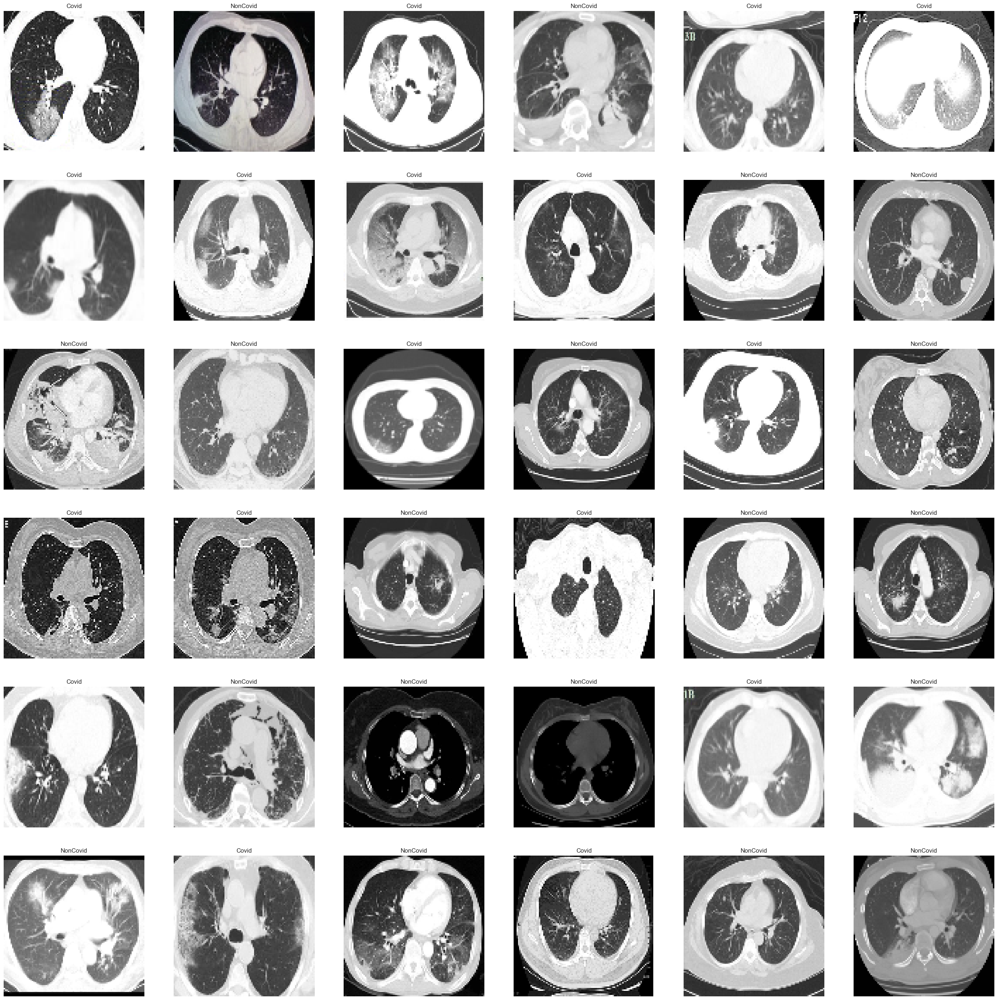

In [164]:
plt.figure(figsize=(35,35))
for n , i in enumerate(list(np.random.randint(0,len(X_train),36))) :
    plt.subplot(6,6,n+1)
    plt.imshow(X_train[i])
    plt.axis('off')
    plt.title(getcode(y_train[i]))

great , now to repeat same steps exactly in test data

In [165]:
X_test = []
y_test = []
for folder in  os.listdir(testpath +'test') :
    files = gb.glob(pathname= str(testpath + 'test//' + folder + '/*.*'))
    for file in files:
        image = cv2.imread(file)
        image_array = cv2.resize(image , (s,s))
        X_test.append(list(image_array))
        y_test.append(code[folder])


In [166]:
print(f'we have {len(X_test)} items in X_test')

we have 77 items in X_test


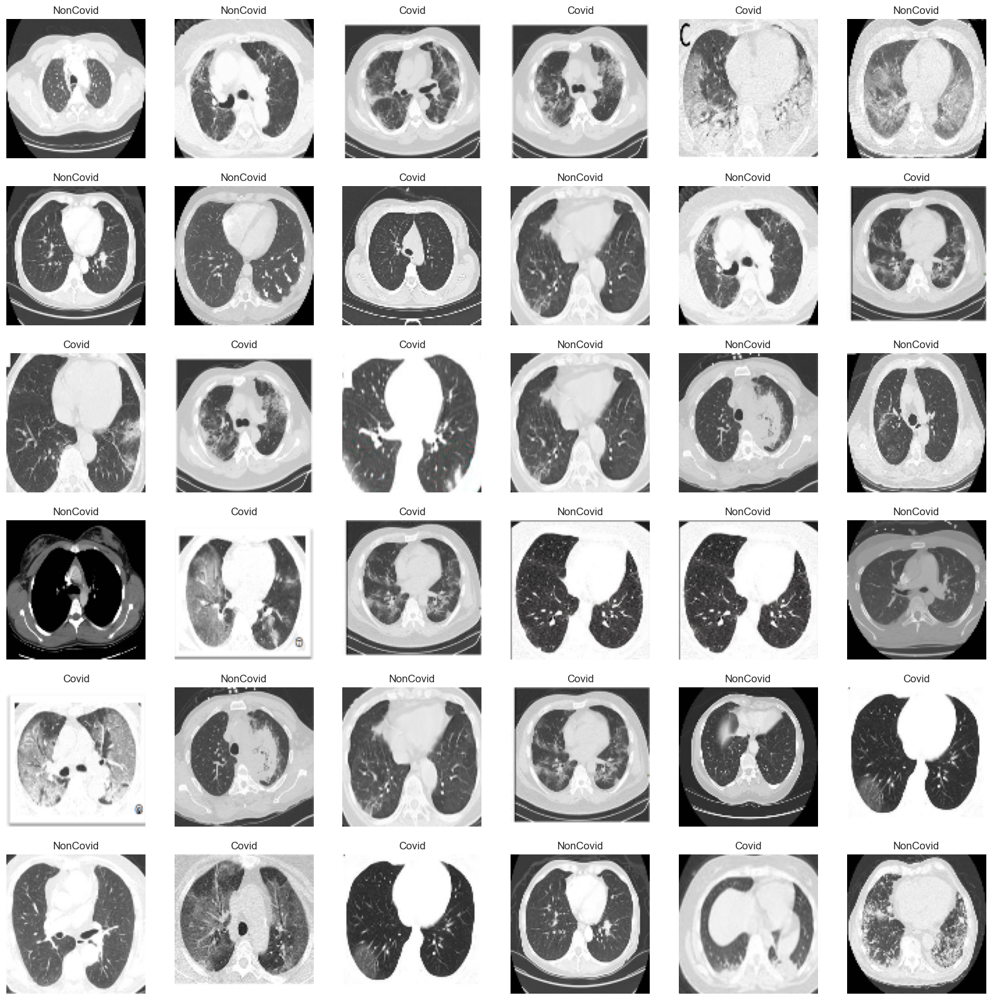

In [167]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_test),36))) :
    plt.subplot(6,6,n+1)
    plt.imshow(X_test[i])
    plt.axis('off')
    plt.title(getcode(y_test[i]))

also with Prediction data , without having title ofcourse

In [168]:
X_pred = []
files = gb.glob(pathname= str(predpath + 'val/*.*'))
for file in files:
    image = cv2.imread(file)
    image_array = cv2.resize(image , (s,s))
    X_pred.append(list(image_array))

In [169]:
print(f'we have {len(X_pred)} items in X_pred')

we have 77 items in X_pred


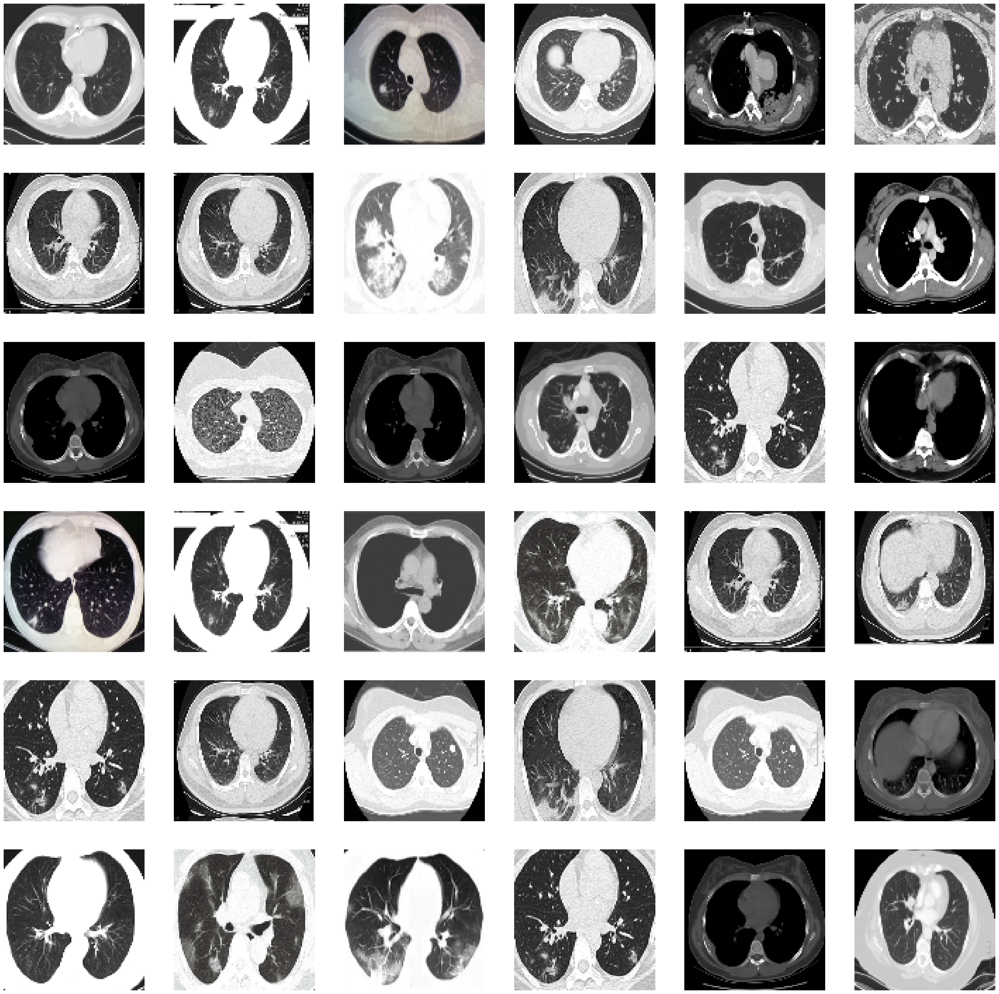

In [170]:
plt.figure(figsize=(35,35))
for n , i in enumerate(list(np.random.randint(0,len(X_pred),36))) :
    plt.subplot(6,6,n+1)
    plt.imshow(X_pred[i])
    plt.axis('off')

________

# Building The Model

now we need to build the model to train our data

first to convert the data into arrays using numpy

In [171]:
X_train = np.array(X_train)
X_test = np.array(X_test)
X_pred_array = np.array(X_pred)
y_train = np.array(y_train)
y_test = np.array(y_test)

print(f'X_train shape  is {X_train.shape}')
print(f'X_test shape  is {X_test.shape}')
print(f'X_pred shape  is {X_pred_array.shape}')
print(f'y_train shape  is {y_train.shape}')
print(f'y_test shape  is {y_test.shape}')

X_train shape  is (596, 100, 100, 3)
X_test shape  is (77, 100, 100, 3)
X_pred shape  is (77, 100, 100, 3)
y_train shape  is (596,)
y_test shape  is (77,)


now to build the CNN model by Keras , using Conv2D layers , MaxPooling & Denses

In [172]:
KerasModel	=keras.models.Sequential([
        keras.layers.Conv2D(200,kernel_size=(3,3),activation='relu',input_shape=(s,s,3)),
        keras.layers.Conv2D(150,kernel_size=(3,3),activation='relu'),
        keras.layers.MaxPool2D(4,4),
        keras.layers.Conv2D(120,kernel_size=(3,3),activation='relu'),
        keras.layers.Conv2D(80,kernel_size=(3,3),activation='relu'),
        keras.layers.Conv2D(50,kernel_size=(3,3),activation='relu'),
        keras.layers.MaxPool2D(4,4),
        keras.layers.Flatten()	,
        keras.layers.Dense(120,activation='relu')	,
        keras.layers.Dense(100,activation='relu')	,
        keras.layers.Dense(50,activation='relu')	,
        keras.layers.Dropout(rate=0.5)	,
        keras.layers.Dense(2,activation='softmax')	,
])

c:\Users\pc 1\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


now to compile the model , using adam optimizer , & sparse categorical crossentropy loss

In [173]:
KerasModel.compile(optimizer ='adam',loss='sparse_categorical_crossentropy',metrics=['accuracy'])

so how the model looks like ?

In [174]:
print('Model Details are : ',KerasModel)
print(KerasModel.summary())

Model Details are :  <Sequential name=sequential_2, built=True>


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_10 (Conv2D)              │ (None, 98, 98, 200)    │         5,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (None, 96, 96, 150)    │       270,150 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 24, 24, 150)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_12 (Conv2D)              │ (None, 22, 22, 120)    │       162,120 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_13 (Conv2D)              │ (None, 20, 20, 80)     │        86,480 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_14 (Conv2D)              │ (None, 18, 18, 50)     │        36,050 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 4, 4, 50)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 800)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 120)            │        96,120 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 100)            │        12,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 50)             │         5,050 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 50)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 2)              │           102 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 673,772 (2.57 MB)

 Trainable params: 673,772 (2.57 MB)

 Non-trainable params: 0 (0.00 B)

None


now to train the model , lets use 50 epochs now

In [175]:
epochs = 50
ThisModel = KerasModel.fit(X_train, y_train, epochs=epochs,batch_size=64,verbose=1)

Epoch 1/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 50s 5s/step - accuracy: 0.5174 - loss: 5.0253
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 47s 5s/step - accuracy: 0.5115 - loss: 0.8332
Epoch 3/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 46s 5s/step - accuracy: 0.5151 - loss: 0.7096
Epoch 4/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 46s 5s/step - accuracy: 0.5548 - loss: 0.6806
Epoch 5/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 46s 5s/step - accuracy: 0.5246 - loss: 0.6798
Epoch 6/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 47s 5s/step - accuracy: 0.5706 - loss: 0.6611
Epoch 7/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 46s 5s/step - accuracy: 0.5671 - loss: 0.6566
Epoch 8/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 46s 5s/step - accuracy: 0.6206 - loss: 0.6453
Epoch 9/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 47s 5s/step - accuracy: 0.6095 - loss: 0.6366
Epoch 10/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 46s 5s/step - accuracy: 0.6064 - loss: 0.6276
Epoch 11/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 47s 5s/step - accuracy: 0.6224 - loss: 0.6236
Epoch 12/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 46s 5s/step - accuracy: 0.6391 - lo

how is the final loss & accuracy


In [176]:
ModelLoss, ModelAccuracy = KerasModel.evaluate(X_test, y_test)

print('Test Loss is {}'.format(ModelLoss))
print('Test Accuracy is {}'.format(ModelAccuracy ))

3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 524ms/step - accuracy: 0.8140 - loss: 1.9405
Test Loss is 1.7053779363632202
Test Accuracy is 0.8311688303947449


ok , only 80% accuracy & can be increased by tuning the hyperparameters



_______

now to predict X test

In [177]:
y_pred = KerasModel.predict(X_test)

print('Prediction Shape is {}'.format(y_pred.shape))

3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 572ms/step
Prediction Shape is (77, 2)


great

now it's time to redict X Predict

In [178]:
y_result = KerasModel.predict(X_pred_array)

print('Prediction Shape is {}'.format(y_result.shape))

3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 527ms/step
Prediction Shape is (77, 2)


In [179]:
KerasModel.save('CV.h5')

and to show random redicted pictures & its predicting category


In [180]:
## for Jupyter
trainpath = r"C:/Users/pc 1/Downloads/archive/Dataset_BUSI_with_GT 1/"
testpath = r"C:/Users/pc 1/Downloads/archive/Dataset_BUSI_with_GT 1/"
predpath = r"C:/Users/pc 1/Downloads/archive/Dataset_BUSI_with_GT 1/"

# Open Folders

now let's first check the Train folder to have a look to its content

In [181]:
for folder in  os.listdir(trainpath + 'train') :
    files = gb.glob(str(trainpath + 'train//' + folder + '/*.*'))
    print(f'For training data , found {len(files)} in folder {folder}')

For training data , found 712 in folder benign
For training data , found 336 in folder malignant
For training data , found 212 in folder normal


ok , how about the test folder

In [182]:
for folder in  os.listdir(testpath +'test') :
    files = gb.glob(str(trainpath + 'test//' + folder + '/*.*'))
    print(f'For testing data , found {len(files)} in folder {folder}')

For testing data , found 90 in folder benign
For testing data , found 43 in folder malignant
For testing data , found 28 in folder normal


_____
now for prediction folder

In [183]:
files = gb.glob(pathname= str(predpath +'val/*.*'))
print(f'For Prediction data , found {len(files)}')

For Prediction data , found 132


_____

# Checking Images

now we need to heck the images sizes , to know ow they looks like

since we have 6 categories , we first need to create a dictionary with their names & indices , also create a function to get the code back

In [184]:
code	=	{'benign':0,'malignant':1,'normal':2}
def getcode(n) :
    for x , y in code.items() :
        if n == y :
            return x

now how about the images sizes in train folder

In [185]:
size = []
for folder in os.listdir(trainpath + 'train'):
    files = gb.glob(pathname=str(trainpath + 'train//' + folder + '/*.*'))
    for file in files:
        try:
            image = cv2.imread(file)
            if image is not None:
                size.append(image.shape)
            else:
                print(f"Failed to load {file}: Image is None")
        except Exception as e:
            print(f"Error reading {file}: {e}")
size_counts = pd.Series(size).value_counts()
print(size_counts)


(470, 562, 3)    9
(468, 560, 3)    8
(576, 779, 3)    7
(471, 557, 3)    7
(467, 556, 3)    7
                ..
(439, 340, 3)    1
(438, 581, 3)    1
(434, 611, 3)    1
(392, 479, 3)    1
(582, 693, 3)    1
Name: count, Length: 623, dtype: int64


______

ok , almost all of them are 150,150,3 , how about test images ?

In [186]:
size = []
for folder in os.listdir(testpath + 'test'):
    files = gb.glob(pathname=str(testpath + 'test//' + folder + '/*.*'))
    for file in files:
        try:
            image = cv2.imread(file)
            if image is not None:
                size.append(image.shape)
            else:
                print(f"Failed to load {file}: Image is None")
        except Exception as e:
            print(f"Error reading {file}: {e}")

size_counts = pd.Series(size).value_counts()
print(size_counts)

(469, 564, 3)    3
(572, 763, 3)    3
(470, 560, 3)    2
(467, 554, 3)    2
(465, 557, 3)    2
                ..
(391, 462, 3)    1
(401, 471, 3)    1
(386, 469, 3)    1
(471, 554, 3)    1
(474, 502, 3)    1
Name: count, Length: 146, dtype: int64


almost same ratios , now to prediction images

In [187]:
size = []
files = gb.glob(pathname= str(predpath +'val/*.*'))
for file in files:
    try:
        image = cv2.imread(file)
        if image is not None:
            size.append(image.shape)
        else:
            print(f"Failed to load {file}: Image is None")
    except Exception as e:
        print(f"Error reading {file}: {e}")

size_counts = pd.Series(size).value_counts()
print(size_counts)

(558, 795, 3)    3
(466, 561, 3)    3
(612, 763, 3)    3
(480, 430, 3)    2
(487, 552, 3)    2
                ..
(578, 770, 3)    1
(485, 733, 3)    1
(313, 391, 3)    1
(583, 775, 3)    1
(580, 777, 3)    1
Name: count, Length: 68, dtype: int64


ok , since almost all of pictures are 150,150,3 , we can feel comfort in using all pictures in our model , after resizing it in a specific amount

# Reading Images

now it's time to read all images & convert it into arrays

first we'll create a variable s , which refer to size , so we can change it easily

let's use now size = 100 , so it will be suitable amount to contain accuracy without losing so much time in training

In [188]:
s = 100

now to read all pictues in six categories in training folder, ans use OpenCV to resize it , and not to forget to assign the y value , from the predefined function

In [189]:
X_train = []
y_train = []
for folder in  os.listdir(trainpath +'train') :
    files = gb.glob(pathname= str( trainpath +'train//' + folder + '/*.*'))
    for file in files:
        image = cv2.imread(file)
        image_array = cv2.resize(image , (s,s))
        X_train.append(list(image_array))
        y_train.append(code[folder])

great , now how many items in X_train

In [190]:
print(f'we have {len(X_train)} items in X_train')

we have 1260 items in X_train


also we have have a look to random pictures in X_train , and to adjust their title using the y value

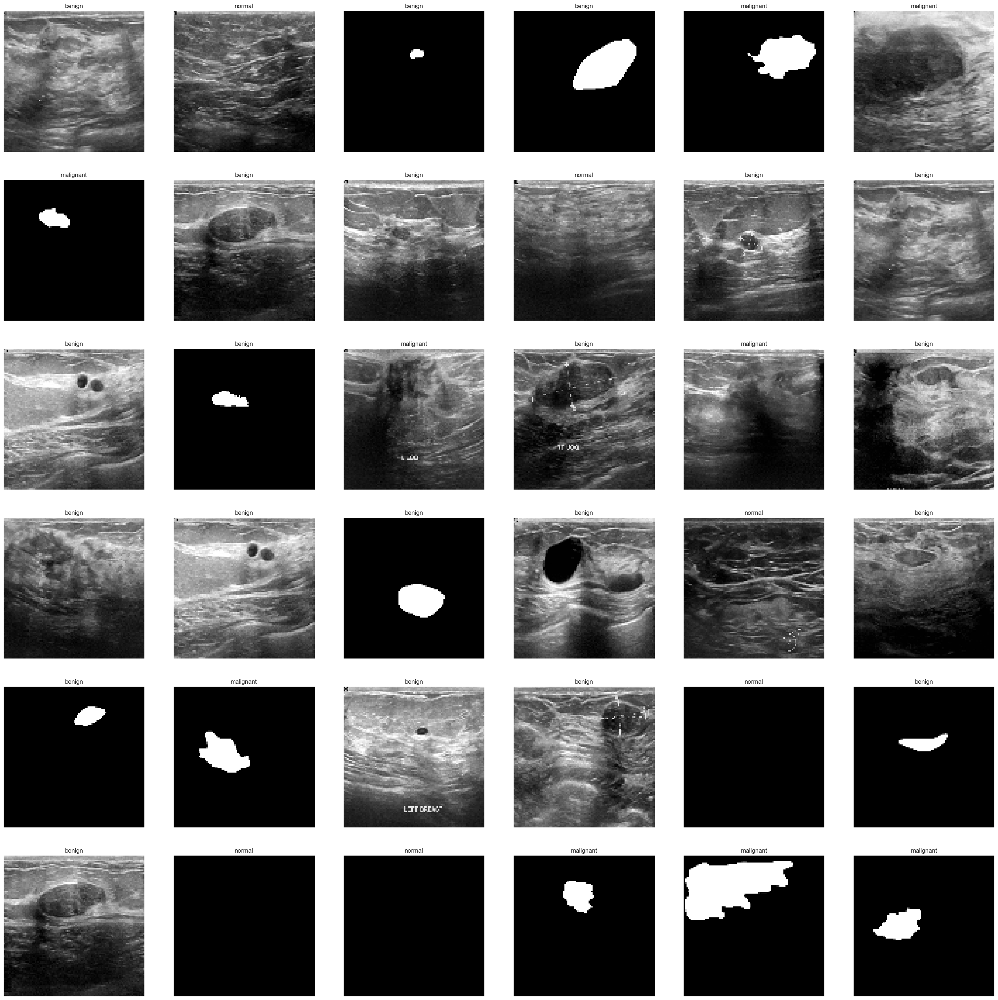

In [191]:
plt.figure(figsize=(35,35))
for n , i in enumerate(list(np.random.randint(0,len(X_train),36))) :
    plt.subplot(6,6,n+1)
    plt.imshow(X_train[i])
    plt.axis('off')
    plt.title(getcode(y_train[i]))

great , now to repeat same steps exactly in test data

In [192]:
X_test = []
y_test = []
for folder in  os.listdir(testpath +'test') :
    files = gb.glob(pathname= str(testpath + 'test//' + folder + '/*.*'))
    for file in files:
        image = cv2.imread(file)
        image_array = cv2.resize(image , (s,s))
        X_test.append(list(image_array))
        y_test.append(code[folder])


In [193]:
print(f'we have {len(X_test)} items in X_test')

we have 161 items in X_test


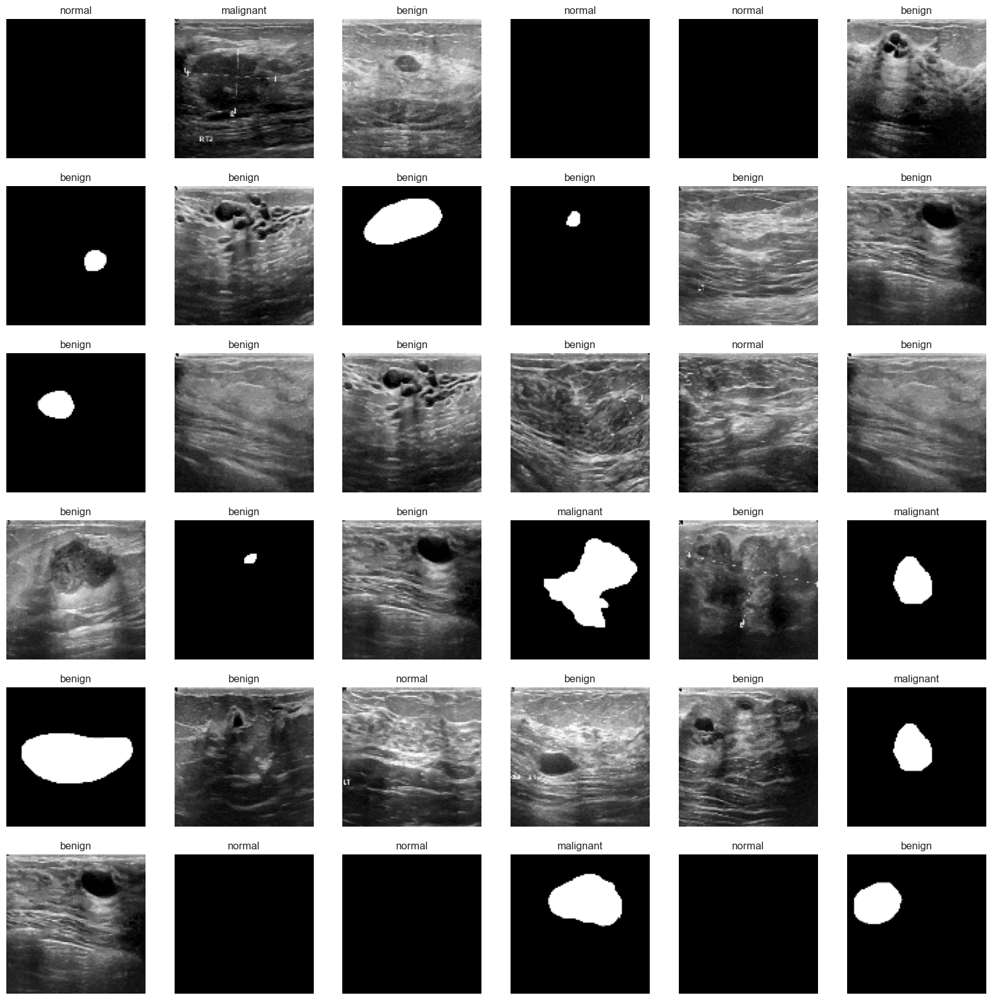

In [194]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_test),36))) :
    plt.subplot(6,6,n+1)
    plt.imshow(X_test[i])
    plt.axis('off')
    plt.title(getcode(y_test[i]))

also with Prediction data , without having title ofcourse

In [195]:
X_pred = []
files = gb.glob(pathname= str(predpath + 'val/*.*'))
for file in files:
    image = cv2.imread(file)
    image_array = cv2.resize(image , (s,s))
    X_pred.append(list(image_array))

In [196]:
print(f'we have {len(X_pred)} items in X_pred')

we have 132 items in X_pred


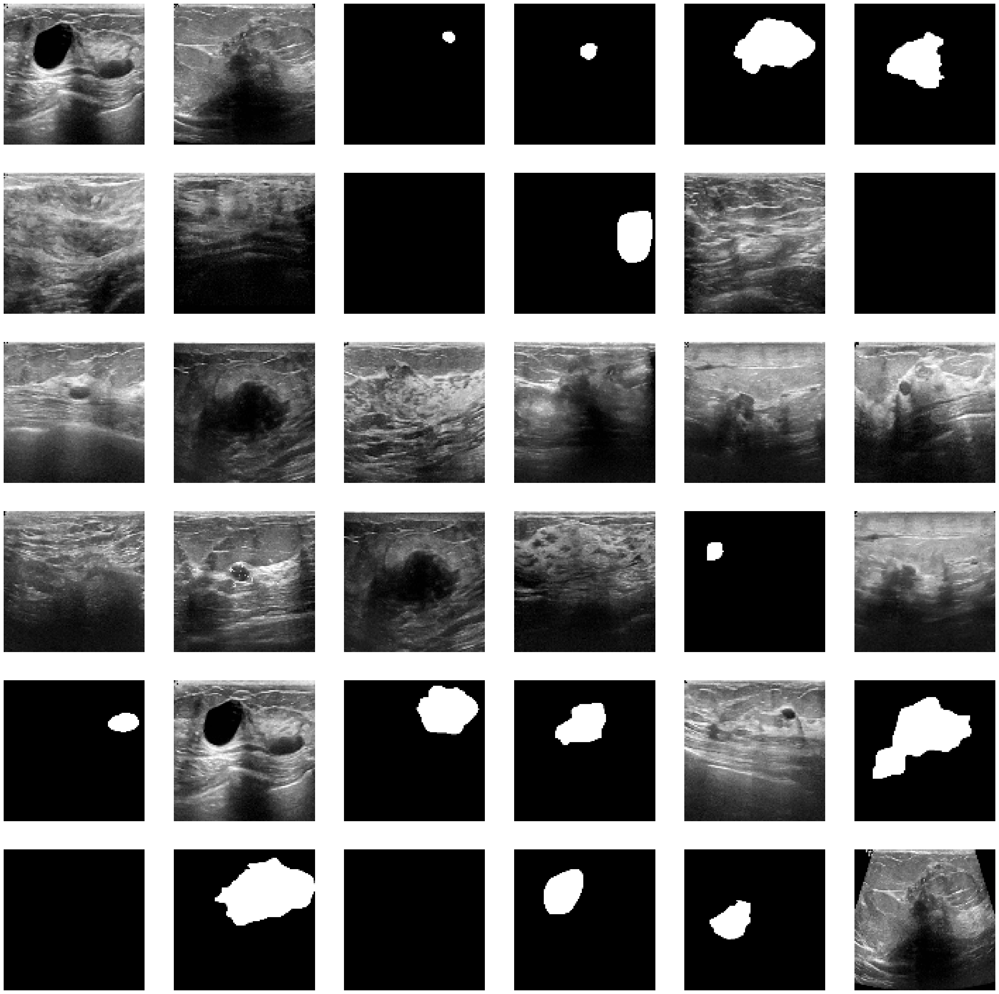

In [197]:
plt.figure(figsize=(35,35))
for n , i in enumerate(list(np.random.randint(0,len(X_pred),36))) :
    plt.subplot(6,6,n+1)
    plt.imshow(X_pred[i])
    plt.axis('off')

________

# Building The Model

now we need to build the model to train our data

first to convert the data into arrays using numpy

In [198]:
X_train = np.array(X_train)
X_test = np.array(X_test)
X_pred_array = np.array(X_pred)
y_train = np.array(y_train)
y_test = np.array(y_test)

print(f'X_train shape  is {X_train.shape}')
print(f'X_test shape  is {X_test.shape}')
print(f'X_pred shape  is {X_pred_array.shape}')
print(f'y_train shape  is {y_train.shape}')
print(f'y_test shape  is {y_test.shape}')

X_train shape  is (1260, 100, 100, 3)
X_test shape  is (161, 100, 100, 3)
X_pred shape  is (132, 100, 100, 3)
y_train shape  is (1260,)
y_test shape  is (161,)


now to build the CNN model by Keras , using Conv2D layers , MaxPooling & Denses

In [199]:
KerasModel	=keras.models.Sequential([
        keras.layers.Conv2D(200,kernel_size=(3,3),activation='relu',input_shape=(s,s,3)),
        keras.layers.Conv2D(150,kernel_size=(3,3),activation='relu'),
        keras.layers.MaxPool2D(4,4),
        keras.layers.Conv2D(120,kernel_size=(3,3),activation='relu'),
        keras.layers.Conv2D(80,kernel_size=(3,3),activation='relu'),
        keras.layers.Conv2D(50,kernel_size=(3,3),activation='relu'),
        keras.layers.MaxPool2D(4,4),
        keras.layers.Flatten()	,
        keras.layers.Dense(120,activation='relu')	,
        keras.layers.Dense(100,activation='relu')	,
        keras.layers.Dense(50,activation='relu')	,
        keras.layers.Dropout(rate=0.5)	,
        keras.layers.Dense(3,activation='softmax')	,
])

c:\Users\pc 1\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


now to compile the model , using adam optimizer , & sparse categorical crossentropy loss

In [200]:
KerasModel.compile(optimizer ='adam',loss='sparse_categorical_crossentropy',metrics=['accuracy'])

so how the model looks like ?

In [201]:
print('Model Details are : ',KerasModel)
print(KerasModel.summary())

Model Details are :  <Sequential name=sequential_3, built=True>


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_15 (Conv2D)              │ (None, 98, 98, 200)    │         5,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_16 (Conv2D)              │ (None, 96, 96, 150)    │       270,150 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 24, 24, 150)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_17 (Conv2D)              │ (None, 22, 22, 120)    │       162,120 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_18 (Conv2D)              │ (None, 20, 20, 80)     │        86,480 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_19 (Conv2D)              │ (None, 18, 18, 50)     │        36,050 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 4, 4, 50)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_3 (Flatten)             │ (None, 800)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 120)            │        96,120 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 100)            │        12,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_14 (Dense)                │ (None, 50)             │         5,050 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 50)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 3)              │           153 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 673,823 (2.57 MB)

 Trainable params: 673,823 (2.57 MB)

 Non-trainable params: 0 (0.00 B)

None


now to train the model , lets use 50 epochs now

In [202]:
epochs = 50
ThisModel = KerasModel.fit(X_train, y_train, epochs=epochs,batch_size=64,verbose=1)

Epoch 1/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 102s 5s/step - accuracy: 0.4264 - loss: 2.8473
Epoch 2/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 99s 5s/step - accuracy: 0.5783 - loss: 0.9055
Epoch 3/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 97s 5s/step - accuracy: 0.6917 - loss: 0.7718
Epoch 4/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 98s 5s/step - accuracy: 0.6840 - loss: 0.7899
Epoch 5/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 97s 5s/step - accuracy: 0.6960 - loss: 0.7353
Epoch 6/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 97s 5s/step - accuracy: 0.7019 - loss: 0.7318
Epoch 7/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 98s 5s/step - accuracy: 0.7318 - loss: 0.6852
Epoch 8/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 97s 5s/step - accuracy: 0.7241 - loss: 0.6833
Epoch 9/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 97s 5s/step - accuracy: 0.7334 - loss: 0.6347
Epoch 10/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 97s 5s/step - accuracy: 0.7433 - loss: 0.6627
Epoch 11/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 97s 5s/step - accuracy: 0.7608 - loss: 0.5848
Epoch 12/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 97s 5s/step - accuracy: 0.7609 - l

how is the final loss & accuracy


In [203]:
ModelLoss, ModelAccuracy = KerasModel.evaluate(X_test, y_test)

print('Test Loss is {}'.format(ModelLoss))
print('Test Accuracy is {}'.format(ModelAccuracy ))

6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 618ms/step - accuracy: 0.8621 - loss: 0.9958
Test Loss is 1.3796517848968506
Test Accuracy is 0.8322981595993042


ok , only 80% accuracy & can be increased by tuning the hyperparameters



_______

now to predict X test

In [204]:
y_pred = KerasModel.predict(X_test)

print('Prediction Shape is {}'.format(y_pred.shape))

6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 647ms/step
Prediction Shape is (161, 3)


great

now it's time to redict X Predict

In [205]:
y_result = KerasModel.predict(X_pred_array)

print('Prediction Shape is {}'.format(y_result.shape))

5/5 ━━━━━━━━━━━━━━━━━━━━ 3s 595ms/step
Prediction Shape is (132, 3)


In [206]:
KerasModel.save('US.h5')

and to show random redicted pictures & its predicting category


and to show random redicted pictures & its predicting category


In [207]:
## for Jupyter
trainpath = r"C:/Users/pc 1/Downloads/Compressed/chest_xray/"
testpath =  r"C:/Users/pc 1/Downloads/Compressed/chest_xray/"
predpath = r"C:/Users/pc 1/Downloads/Compressed/chest_xray/"

# Open Folders

now let's first check the Train folder to have a look to its content

In [208]:
for folder in  os.listdir(trainpath + 'train') :
    files = gb.glob(str(trainpath + 'train//' + folder + '/*.*'))
    print(f'For training data , found {len(files)} in folder {folder}')

For training data , found 1341 in folder NORMAL
For training data , found 3875 in folder PNEUMONIA


ok , how about the test folder

In [209]:
for folder in  os.listdir(testpath +'test') :
    files = gb.glob(str(trainpath + 'test//' + folder + '/*.*'))
    print(f'For testing data , found {len(files)} in folder {folder}')

For testing data , found 234 in folder NORMAL
For testing data , found 390 in folder PNEUMONIA


_____
now for prediction folder

In [210]:
files = gb.glob(pathname= str(predpath +'val/*.*'))
print(f'For Prediction data , found {len(files)}')

For Prediction data , found 104


_____

# Checking Images

now we need to heck the images sizes , to know ow they looks like

since we have 6 categories , we first need to create a dictionary with their names & indices , also create a function to get the code back

In [211]:
code	=	{'PNEUMONIA':0,'NORMAL':1}
def getcode(n) :
    for x , y in code.items() :
        if n == y :
            return x

now how about the images sizes in train folder

In [212]:
size = []
for folder in os.listdir(trainpath + 'train'):
    files = gb.glob(pathname=str(trainpath + 'train//' + folder + '/*.*'))
    for file in files:
        try:
            image = cv2.imread(file)
            if image is not None:
                size.append(image.shape)
            else:
                print(f"Failed to load {file}: Image is None")
        except Exception as e:
            print(f"Error reading {file}: {e}")
size_counts = pd.Series(size).value_counts()
print(size_counts)


(648, 1072, 3)     7
(728, 1080, 3)     6
(704, 1008, 3)     5
(760, 1064, 3)     5
(592, 992, 3)      5
                  ..
(880, 1064, 3)     1
(1184, 1816, 3)    1
(910, 1400, 3)     1
(728, 1112, 3)     1
(728, 1248, 3)     1
Name: count, Length: 4366, dtype: int64


______

ok , almost all of them are 150,150,3 , how about test images ?

In [213]:
size = []
for folder in os.listdir(testpath + 'test'):
    files = gb.glob(pathname=str(testpath + 'test//' + folder + '/*.*'))
    for file in files:
        try:
            image = cv2.imread(file)
            if image is not None:
                size.append(image.shape)
            else:
                print(f"Failed to load {file}: Image is None")
        except Exception as e:
            print(f"Error reading {file}: {e}")

size_counts = pd.Series(size).value_counts()
print(size_counts)

(736, 1112, 3)     3
(824, 1168, 3)     2
(648, 1184, 3)     2
(616, 1072, 3)     2
(784, 1120, 3)     2
                  ..
(1168, 1778, 3)    1
(1202, 1538, 3)    1
(917, 1288, 3)     1
(963, 1542, 3)     1
(1122, 1704, 3)    1
Name: count, Length: 598, dtype: int64


almost same ratios , now to prediction images

In [214]:
size = []
files = gb.glob(pathname= str(predpath +'val/*.*'))
for file in files:
    try:
        image = cv2.imread(file)
        if image is not None:
            size.append(image.shape)
        else:
            print(f"Failed to load {file}: Image is None")
    except Exception as e:
        print(f"Error reading {file}: {e}")

size_counts = pd.Series(size).value_counts()
print(size_counts)

(560, 1000, 3)     2
(1097, 1256, 3)    1
(528, 896, 3)      1
(664, 1040, 3)     1
(704, 1048, 3)     1
                  ..
(1399, 1546, 3)    1
(1908, 2036, 3)    1
(1653, 1882, 3)    1
(1167, 1464, 3)    1
(1072, 1448, 3)    1
Name: count, Length: 103, dtype: int64


ok , since almost all of pictures are 150,150,3 , we can feel comfort in using all pictures in our model , after resizing it in a specific amount

# Reading Images

now it's time to read all images & convert it into arrays

first we'll create a variable s , which refer to size , so we can change it easily

let's use now size = 100 , so it will be suitable amount to contain accuracy without losing so much time in training

In [215]:
s = 100

now to read all pictues in six categories in training folder, ans use OpenCV to resize it , and not to forget to assign the y value , from the predefined function

In [216]:
X_train = []
y_train = []
for folder in  os.listdir(trainpath +'train') :
    files = gb.glob(pathname= str( trainpath +'train//' + folder + '/*.*'))
    for file in files:
        image = cv2.imread(file)
        image_array = cv2.resize(image , (s,s))
        X_train.append(list(image_array))
        y_train.append(code[folder])

great , now how many items in X_train

In [217]:
print(f'we have {len(X_train)} items in X_train')

we have 5216 items in X_train


also we have have a look to random pictures in X_train , and to adjust their title using the y value

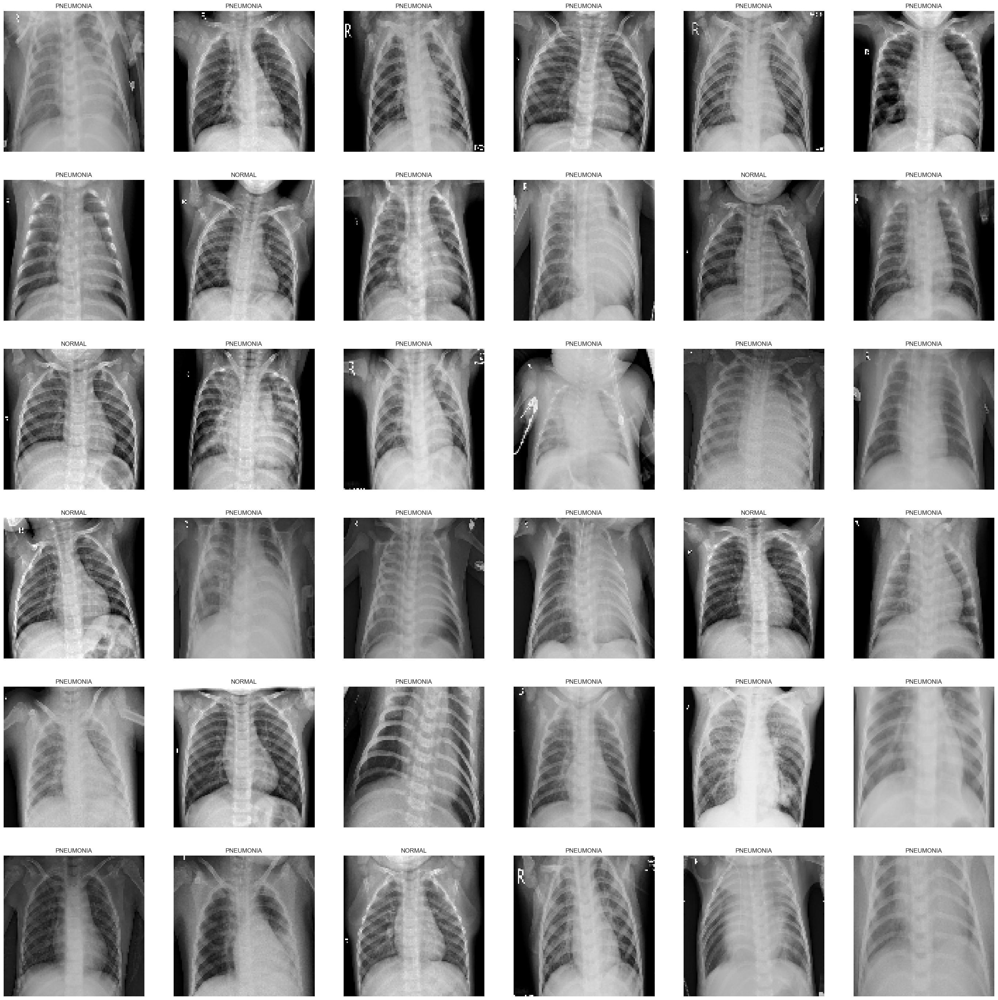

In [218]:
plt.figure(figsize=(35,35))
for n , i in enumerate(list(np.random.randint(0,len(X_train),36))) :
    plt.subplot(6,6,n+1)
    plt.imshow(X_train[i])
    plt.axis('off')
    plt.title(getcode(y_train[i]))

great , now to repeat same steps exactly in test data

In [219]:
X_test = []
y_test = []
for folder in  os.listdir(testpath +'test') :
    files = gb.glob(pathname= str(testpath + 'test//' + folder + '/*.*'))
    for file in files:
        image = cv2.imread(file)
        image_array = cv2.resize(image , (s,s))
        X_test.append(list(image_array))
        y_test.append(code[folder])


In [220]:
print(f'we have {len(X_test)} items in X_test')

we have 624 items in X_test


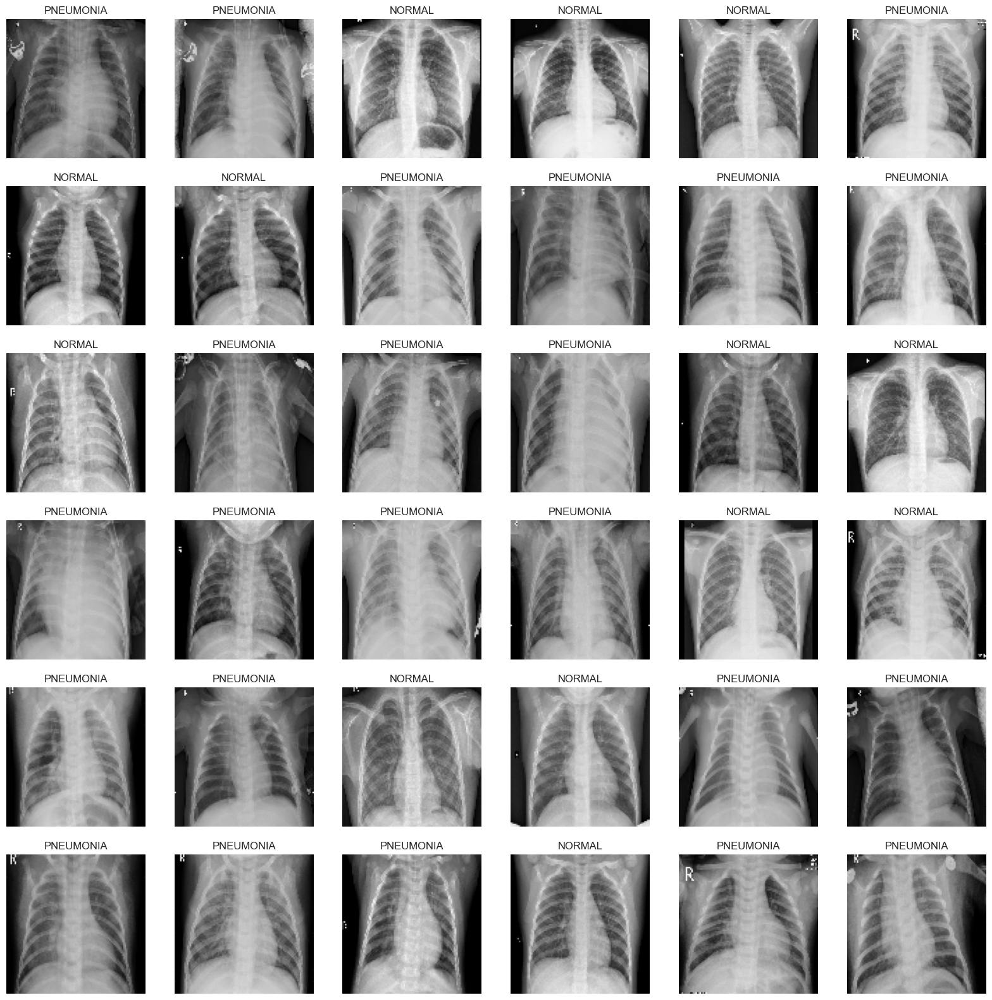

In [221]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_test),36))) :
    plt.subplot(6,6,n+1)
    plt.imshow(X_test[i])
    plt.axis('off')
    plt.title(getcode(y_test[i]))

also with Prediction data , without having title ofcourse

In [222]:
X_pred = []
files = gb.glob(pathname= str(predpath + 'val/*.*'))
for file in files:
    image = cv2.imread(file)
    image_array = cv2.resize(image , (s,s))
    X_pred.append(list(image_array))

In [223]:
print(f'we have {len(X_pred)} items in X_pred')

we have 104 items in X_pred


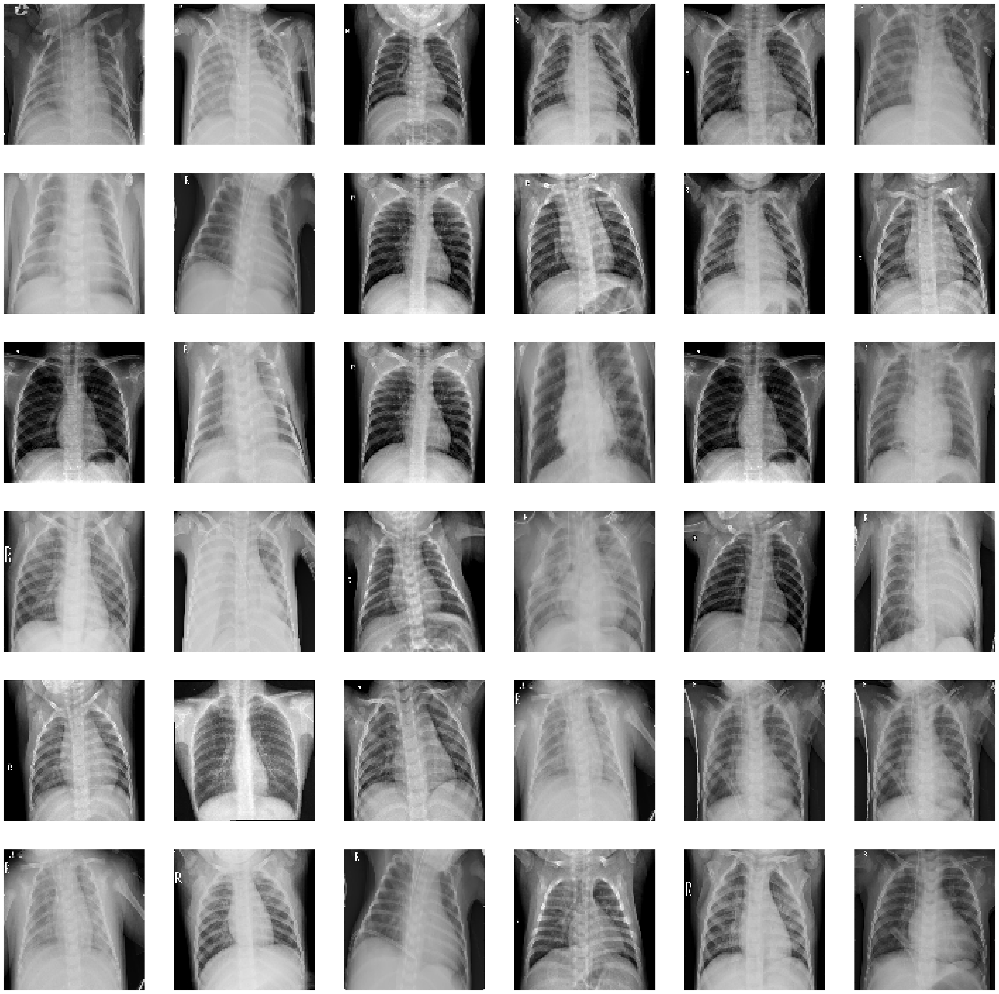

In [224]:
plt.figure(figsize=(35,35))
for n , i in enumerate(list(np.random.randint(0,len(X_pred),36))) :
    plt.subplot(6,6,n+1)
    plt.imshow(X_pred[i])
    plt.axis('off')

________

# Building The Model

now we need to build the model to train our data

first to convert the data into arrays using numpy

In [225]:
X_train = np.array(X_train)
X_test = np.array(X_test)
X_pred_array = np.array(X_pred)
y_train = np.array(y_train)
y_test = np.array(y_test)

print(f'X_train shape  is {X_train.shape}')
print(f'X_test shape  is {X_test.shape}')
print(f'X_pred shape  is {X_pred_array.shape}')
print(f'y_train shape  is {y_train.shape}')
print(f'y_test shape  is {y_test.shape}')

X_train shape  is (5216, 100, 100, 3)
X_test shape  is (624, 100, 100, 3)
X_pred shape  is (104, 100, 100, 3)
y_train shape  is (5216,)
y_test shape  is (624,)


now to build the CNN model by Keras , using Conv2D layers , MaxPooling & Denses

In [226]:
KerasModel	=keras.models.Sequential([
        keras.layers.Conv2D(200,kernel_size=(3,3),activation='relu',input_shape=(s,s,3)),
        keras.layers.Conv2D(150,kernel_size=(3,3),activation='relu'),
        keras.layers.MaxPool2D(4,4),
        keras.layers.Conv2D(120,kernel_size=(3,3),activation='relu'),
        keras.layers.Conv2D(80,kernel_size=(3,3),activation='relu'),
        keras.layers.Conv2D(50,kernel_size=(3,3),activation='relu'),
        keras.layers.MaxPool2D(4,4),
        keras.layers.Flatten()	,
        keras.layers.Dense(120,activation='relu')	,
        keras.layers.Dense(100,activation='relu')	,
        keras.layers.Dense(50,activation='relu')	,
        keras.layers.Dropout(rate=0.5)	,
        keras.layers.Dense(2,activation='softmax')	,
])

c:\Users\pc 1\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


now to compile the model , using adam optimizer , & sparse categorical crossentropy loss

In [227]:
KerasModel.compile(optimizer ='adam',loss='sparse_categorical_crossentropy',metrics=['accuracy'])

so how the model looks like ?

In [228]:
print('Model Details are : ',KerasModel)
print(KerasModel.summary())

Model Details are :  <Sequential name=sequential_4, built=True>


Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_20 (Conv2D)              │ (None, 98, 98, 200)    │         5,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_21 (Conv2D)              │ (None, 96, 96, 150)    │       270,150 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_8 (MaxPooling2D)  │ (None, 24, 24, 150)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_22 (Conv2D)              │ (None, 22, 22, 120)    │       162,120 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_23 (Conv2D)              │ (None, 20, 20, 80)     │        86,480 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_24 (Conv2D)              │ (None, 18, 18, 50)     │        36,050 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_9 (MaxPooling2D)  │ (None, 4, 4, 50)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_4 (Flatten)             │ (None, 800)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 120)            │        96,120 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_17 (Dense)                │ (None, 100)            │        12,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 50)             │         5,050 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 50)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_19 (Dense)                │ (None, 2)              │           102 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 673,772 (2.57 MB)

 Trainable params: 673,772 (2.57 MB)

 Non-trainable params: 0 (0.00 B)

None


now to train the model , lets use 50 epochs now

In [229]:
epochs = 50
ThisModel = KerasModel.fit(X_train, y_train, epochs=epochs,batch_size=64,verbose=1)

Epoch 1/50
82/82 ━━━━━━━━━━━━━━━━━━━━ 409s 5s/step - accuracy: 0.6802 - loss: 1.9735
Epoch 2/50
82/82 ━━━━━━━━━━━━━━━━━━━━ 401s 5s/step - accuracy: 0.8859 - loss: 0.2896
Epoch 3/50
82/82 ━━━━━━━━━━━━━━━━━━━━ 403s 5s/step - accuracy: 0.9415 - loss: 0.1647
Epoch 4/50
82/82 ━━━━━━━━━━━━━━━━━━━━ 400s 5s/step - accuracy: 0.9430 - loss: 0.1461
Epoch 5/50
82/82 ━━━━━━━━━━━━━━━━━━━━ 400s 5s/step - accuracy: 0.9491 - loss: 0.1559
Epoch 6/50
82/82 ━━━━━━━━━━━━━━━━━━━━ 403s 5s/step - accuracy: 0.9644 - loss: 0.0921
Epoch 7/50
82/82 ━━━━━━━━━━━━━━━━━━━━ 402s 5s/step - accuracy: 0.9584 - loss: 0.1110
Epoch 8/50
82/82 ━━━━━━━━━━━━━━━━━━━━ 401s 5s/step - accuracy: 0.9692 - loss: 0.0859
Epoch 9/50
82/82 ━━━━━━━━━━━━━━━━━━━━ 403s 5s/step - accuracy: 0.9635 - loss: 0.1044
Epoch 10/50
82/82 ━━━━━━━━━━━━━━━━━━━━ 402s 5s/step - accuracy: 0.9773 - loss: 0.0716
Epoch 11/50
82/82 ━━━━━━━━━━━━━━━━━━━━ 401s 5s/step - accuracy: 0.9703 - loss: 0.0780
Epoch 12/50
82/82 ━━━━━━━━━━━━━━━━━━━━ 401s 5s/step - accuracy:

how is the final loss & accuracy


In [230]:
ModelLoss, ModelAccuracy = KerasModel.evaluate(X_test, y_test)

print('Test Loss is {}'.format(ModelLoss))
print('Test Accuracy is {}'.format(ModelAccuracy ))

20/20 ━━━━━━━━━━━━━━━━━━━━ 15s 751ms/step - accuracy: 0.5307 - loss: 16.3902
Test Loss is 9.348767280578613
Test Accuracy is 0.7483974099159241


ok , only 80% accuracy & can be increased by tuning the hyperparameters



_______

now to predict X test

In [231]:
y_pred = KerasModel.predict(X_test)

print('Prediction Shape is {}'.format(y_pred.shape))

20/20 ━━━━━━━━━━━━━━━━━━━━ 15s 755ms/step
Prediction Shape is (624, 2)


great

now it's time to redict X Predict

In [232]:
y_result = KerasModel.predict(X_pred_array)

print('Prediction Shape is {}'.format(y_result.shape))

4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 565ms/step
Prediction Shape is (104, 2)


In [233]:
KerasModel.save('XR.h5')

In [244]:
import tkinter as tk
from tkinter import *
from PIL import ImageTk,Image
import webbrowser
from tkinter import ttk
from tkinter import messagebox
from tkinter import filedialog
from PIL import Image, ImageTk 
#===============================================================================#
root =Tk()
root.title("Radiology Center")
root.geometry("1400x700+400+200")
font=('Berlin Sans FB Demi',20,'bold')
root.configure(bg="#219ebc")
bg="#edf2f4"
#===============================================================================#
def center_screen(w,h):
    screenwidth=root.winfo_screenwidth()
    screenhight=root.winfo_screenheight()
    root.resizable(FALSE,FALSE)
    x=int ((screenwidth-w)/2)-10
    y=int ((screenhight-h)/2)-30
    root.geometry(f"{w}x{h}+{x}+{y}")
center_screen(1400,700)
#===============================================================================#
# تحميل الصورة وضمان وجود مرجع قوي لها
img = PhotoImage(file="D:/paython/ML PJ/Blue and White Modern Lab Project Presentation (2).png")
background_label = Label(root, image=img)
background_label.place(relheight=1, relwidth=1)

# الحفاظ على المرجع للصورة لتجنب جمع القمامة
background_label.image = img

#===============================================================================#

# تحميل النموذج المدرب
model = load_model('US.h5')
model1=load_model('CV.h5')
model2=load_model('XR.h5')

# أسماء التصنيفات
class_names = ['benign', 'malignant', 'normal']
class_names1 = ['Covid', 'NonCovid']
class_names2 = ['PNEUMONIA','NORMAL']
#===============================================================================#
def go():

    window = Toplevel()
    window.geometry("1000x560")
    window.title("X-RAYS")
    window.resizable(FALSE, FALSE)
#===============================================================================#

    # تحميل الصورة
    image_path = PhotoImage(file="D:/paython/ML PJ/1 (2).png")
#===============================================================================#
    
    # تعيين الخلفية كـ Label
    lbl_img = Label(window, image=image_path)
    lbl_img.place(x=0, y=0, relheight=1, relwidth=1)
#===============================================================================#

    # وضع الزر الاكس راي
    btn_xray = Button(window, text="X-RAY ", width=15, pady=5, border=1, fg="#000000", bg="#ffffff", font=font, command=lambda: xray(window))
    btn_xray.place(x=70, y=320)
#===============================================================================#

    # زر الاترا ساوند
    btn = Button(window, text="ULTRASOUND", width=15, pady=5, border=1, fg="#ffffff", bg="#219ebc", font=font, command=lambda: ultrasound(window)).place(x=400, y=360)
#===============================================================================#
    #زر كوفيد 19 اكس راي 
    btn1 = Button(window, text="COVID-19\nX-RAY", width=12, pady=5, border=1, fg="#000000", bg="#ffffff", font=font, command=lambda: CV(window)).place(x=750, y=320)
#===============================================================================#
    

    # أيقونة النافذة
    window.iconbitmap("D:/prject/images/boutique.ico")

#===============================================================================#
    # دالة لتمركز النافذة
    def center_screen(w, h):
        screenwidth = window.winfo_screenwidth()
        screenheight = window.winfo_screenheight()
        x = int((screenwidth - w) / 2) + 10
        y = int((screenheight - h) / 2) + 20
        window.geometry(f"{w}x{h}+{x}+{y}")
#===============================================================================#
    center_screen(1000, 560)
#===============================================================================#
#COVID-19
def quit(window1, parent_window):
    window1.destroy()  # إغلاق النافذة الحالية
    parent_window.deiconify()  # إعادة إظهار النافذة الرئيسية
def CV(parent_window):
    parent_window.withdraw()

    # دالة لتحميل الصورة
    def select_image():
        global img_path
        img_path = filedialog.askopenfilename()
        if img_path:  # التأكد من أن المسار صالح
            img = Image.open(img_path)
            img = img.resize((250, 250))  # تغيير حجم الصورة للعرض
            img = ImageTk.PhotoImage(img)
            image_label.configure(image=img)
            image_label.image = img

    # دالة للتنبؤ وعرض النتيجة
    def predict_image():
        if not img_path:
            messagebox.showerror("Error", "Please load an image first.")
            return
        
        img = Image.open(img_path)
        img = img.convert('RGB')
        img = img.resize((100, 100))  # تغيير حجم الصورة ليتوافق مع المدخلات المطلوبة للنموذج
        img = np.array(img)
        img = np.expand_dims(img, axis=0)
        
        # التنبؤ بالفئة باستخدام النموذج
        prediction = model1.predict(img)
        class_index = np.argmax(prediction)
        class_name = class_names1[class_index]
        
        result_label.configure(text=f'Prediction: {class_name}')

    # إعداد نافذة جديدة باستخدام Toplevel
    rt = tk.Toplevel(root)
    rt.title('COVID-19')
    rt.geometry('600x500')
    rt.configure(bg='#003049')

    # زر تحميل الصورة
    load_button = tk.Button(rt, text='Load Image', bg='#90e0ef', fg="#ffffff", font=('Berlin Sans FB Demi', 15, 'bold'), command=select_image)
    load_button.place(x=245, y=60)

    # عرض الصورة
    image_label = tk.Label(rt)
    image_label.place(x=180, y=110)

    # زر التنبؤ
    predict_button = tk.Button(rt, text='Predict', bg='#90e0ef', fg="#ffffff", font=('Berlin Sans FB Demi', 15, 'bold'), command=predict_image)
    predict_button.place(x=270, y=370)

    # عرض النتيجة
    result_label = tk.Label(rt, text='Prediction: ', bg='#90e0ef', fg="#000000", font=('Berlin Sans FB Demi', 15, 'bold'))
    result_label.place(x=210, y=420)
    
    def back_to_xrays():
        rt.destroy()  # إغلاق صفحة Ultrasound
        parent_window.deiconify()
    back_button = tk.Button(rt, text="Back", bg="#f77f00", fg="#ffffff", font=('Berlin Sans FB Demi', 15, 'bold'), command=back_to_xrays)
    back_button.place(x=10, y=10)

    lbl = tk.Label(rt, text=("COVID 19 Classifier"), bg='#90e0ef', fg="#000000", font=('Aisha Arabic Exbd', 30, 'bold'))
    lbl.place(x=160, y=1)
#===============================================================================#
#ULTRASOUND
# دالة لإغلاق النافذة الحالية وإظهار النافذة الرئيسية
def quit(window1, parent_window):
    window1.destroy()  # إغلاق النافذة الحالية
    parent_window.deiconify()  # إعادة إظهار النافذة الرئيسية
def ultrasound(parent_window):
    parent_window.withdraw()

    # دالة لتحميل الصورة
    def select_image():
        global img_path
        img_path = filedialog.askopenfilename()
        if img_path:  # التأكد من أن المسار صالح
            img = Image.open(img_path)
            img = img.resize((250, 250))  # تغيير حجم الصورة للعرض
            img = ImageTk.PhotoImage(img)
            image_label.configure(image=img)
            image_label.image = img

    # دالة للتنبؤ وعرض النتيجة
    def predict_image():
        if not img_path:
            messagebox.showerror("Error", "Please load an image first.")
            return
        
        img = Image.open(img_path)
        img = img.convert('RGB')
        img = img.resize((100, 100))  # تغيير حجم الصورة ليتوافق مع المدخلات المطلوبة للنموذج
        img = np.array(img)
        img = np.expand_dims(img, axis=0)
        
        # التنبؤ بالفئة باستخدام النموذج
        prediction = model.predict(img)
        class_index = np.argmax(prediction)
        class_name = class_names[class_index]
        
        result_label.configure(text=f'Prediction: {class_name}')

    # إعداد نافذة جديدة باستخدام Toplevel
    rt = tk.Toplevel(root)
    rt.title('Ultrasound Classifier')
    rt.geometry('600x500')
    rt.configure(bg='#003049')

    # زر تحميل الصورة
    load_button = tk.Button(rt, text='Load Image', bg='#90e0ef', fg="#ffffff", font=('Berlin Sans FB Demi', 15, 'bold'), command=select_image)
    load_button.place(x=245, y=60)

    # عرض الصورة
    image_label = tk.Label(rt)
    image_label.place(x=180, y=110)

    # زر التنبؤ
    predict_button = tk.Button(rt, text='Predict', bg='#90e0ef', fg="#ffffff", font=('Berlin Sans FB Demi', 15, 'bold'), command=predict_image)
    predict_button.place(x=270, y=370)
    # زر الرجوع 
    def back_to_xrays():
        rt.destroy()  # إغلاق صفحة Ultrasound
        parent_window.deiconify()
    back_button = tk.Button(rt, text="Back", bg="#f77f00", fg="#ffffff", font=('Berlin Sans FB Demi', 15, 'bold'), command=back_to_xrays)
    back_button.place(x=10, y=10)


    # عرض النتيجة
    result_label = tk.Label(rt, text='Prediction: ', bg='#90e0ef', fg="#000000", font=('Berlin Sans FB Demi', 15, 'bold'))
    result_label.place(x=210, y=420)

    lbl = tk.Label(rt, text=("Ultrasound Classifier"), bg='#90e0ef', fg="#000000", font=('Aisha Arabic Exbd', 30, 'bold'))
    lbl.place(x=160, y=1)
#===================================================================================#
#XRAY
def quit(window1, parent_window):
    window1.destroy()  # إغلاق النافذة الحالية
    parent_window.deiconify()  # إعادة إظهار النافذة الرئيسية
def xray(parent_window):
    parent_window.withdraw()

    # دالة لتحميل الصورة
    def select_image():
        global img_path
        img_path = filedialog.askopenfilename()
        if img_path:  # التأكد من أن المسار صالح
            img = Image.open(img_path)
            img = img.resize((250, 250))  # تغيير حجم الصورة للعرض
            img = ImageTk.PhotoImage(img)
            image_label.configure(image=img)
            image_label.image = img

    # دالة للتنبؤ وعرض النتيجة
    def predict_image():
        if not img_path:
            messagebox.showerror("Error", "Please load an image first.")
            return
        
        img = Image.open(img_path)
        img = img.convert('RGB')
        img = img.resize((100, 100))  # تغيير حجم الصورة ليتوافق مع المدخلات المطلوبة للنموذج
        img = np.array(img)
        img = np.expand_dims(img, axis=0)
        
        # التنبؤ بالفئة باستخدام النموذج
        prediction = model2.predict(img)
        class_index = np.argmax(prediction)
        class_name = class_names2[class_index]
        
        result_label.configure(text=f'Prediction: {class_name}')

    # إعداد نافذة جديدة باستخدام Toplevel
    rt = tk.Toplevel(root)
    rt.title('COVID-19')
    rt.geometry('600x500')
    rt.configure(bg='#003049')

    # زر تحميل الصورة
    load_button = tk.Button(rt, text='Load Image', bg='#90e0ef', fg="#ffffff", font=('Berlin Sans FB Demi', 15, 'bold'), command=select_image)
    load_button.place(x=245, y=60)

    # عرض الصورة
    image_label = tk.Label(rt)
    image_label.place(x=180, y=110)

    # زر التنبؤ
    predict_button = tk.Button(rt, text='Predict', bg='#90e0ef', fg="#ffffff", font=('Berlin Sans FB Demi', 15, 'bold'), command=predict_image)
    predict_button.place(x=270, y=370)

    # عرض النتيجة
    result_label = tk.Label(rt, text='Prediction: ', bg='#90e0ef', fg="#000000", font=('Berlin Sans FB Demi', 15, 'bold'))
    result_label.place(x=210, y=420)
    def back_to_xrays():
        rt.destroy()  # إغلاق صفحة Ultrasound
        parent_window.deiconify()
    back_button = tk.Button(rt, text="Back", bg="#f77f00", fg="#ffffff", font=('Berlin Sans FB Demi', 15, 'bold'), command=back_to_xrays)
    back_button.place(x=10, y=10)

    lbl = tk.Label(rt, text=("COVID 19 Classifier"), bg='#90e0ef', fg="#000000", font=('Aisha Arabic Exbd', 30, 'bold'))
    lbl.place(x=160, y=1)
btn_login=Button(root,text="LET'S START",width=20,pady=5,border=1,fg="#ffffff",bg="#219ebc",font=font,command=go).place(x=120,y=450)
root.mainloop()


Exception in Tkinter callback
Traceback (most recent call last):
  File "c:\Users\pc 1\AppData\Local\Programs\Python\Python312\Lib\tkinter\__init__.py", line 1948, in __call__
    return self.func(*args)
           ^^^^^^^^^^^^^^^^
  File "C:\Users\pc 1\AppData\Local\Temp\ipykernel_23444\93227439.py", line 77, in go
    window.iconbitmap("D:/prject/images/boutique.ico")
  File "c:\Users\pc 1\AppData\Local\Programs\Python\Python312\Lib\tkinter\__init__.py", line 2136, in wm_iconbitmap
    return self.tk.call('wm', 'iconbitmap', self._w, bitmap)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
_tkinter.TclError: bitmap "D:/prject/images/boutique.ico" not defined


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
